In [5]:
import os
import pandas as pd
import cv2
import matplotlib.pyplot as plt
from patchify import patchify, unpatchify
import seaborn as sns
import random
import numpy as np
import math
from sklearn.model_selection import train_test_split
import pickle
import tensorflow as tf

# Importing Dataset

### Extracting image paths for SSID dataset

In [6]:
dir = os.listdir('datasets/SIDD_Small_sRGB_Only/Data')

folders = []
GT = []
Noisy = []

for folder in dir:
    folders.append(folder)

for folder in folders:
    files = os.listdir('datasets/SIDD_Small_sRGB_Only/Data/' + folder)
    for image in files:
        if image[5] == 'G':
            GT.append('datasets/SIDD_Small_sRGB_Only/Data/' + folder + '/' + image)
        else:
            Noisy.append('datasets/SIDD_Small_sRGB_Only/Data/' + folder + '/' + image)

In [7]:
df = pd.DataFrame()
df['Ground Truth Images'] = GT
df['Noisy Images'] = Noisy
df.head()

,Ground Truth Images,Noisy Images
0,datasets/SIDD_Small_sRGB_Only/Data/0001_001_S6...,datasets/SIDD_Small_sRGB_Only/Data/0001_001_S6...
1,datasets/SIDD_Small_sRGB_Only/Data/0002_001_S6...,datasets/SIDD_Small_sRGB_Only/Data/0002_001_S6...
2,datasets/SIDD_Small_sRGB_Only/Data/0003_001_S6...,datasets/SIDD_Small_sRGB_Only/Data/0003_001_S6...
3,datasets/SIDD_Small_sRGB_Only/Data/0004_001_S6...,datasets/SIDD_Small_sRGB_Only/Data/0004_001_S6...
4,datasets/SIDD_Small_sRGB_Only/Data/0005_001_S6...,datasets/SIDD_Small_sRGB_Only/Data/0005_001_S6...


In [8]:
df.shape

(160, 2)

 # Exploratory Data Analysis

### Image Sizes

In [9]:
size = []
for i in range(len(df)):
    img_gt = cv2.imread(df['Ground Truth Images'].iloc[i])
    size.append(img_gt.shape)

In [10]:
df['image size'] = size
df['image size'] = df['image size'].astype(str)
df.head()

,Ground Truth Images,Noisy Images,image size
0,datasets/SIDD_Small_sRGB_Only/Data/0001_001_S6...,datasets/SIDD_Small_sRGB_Only/Data/0001_001_S6...,"(3000, 5328, 3)"
1,datasets/SIDD_Small_sRGB_Only/Data/0002_001_S6...,datasets/SIDD_Small_sRGB_Only/Data/0002_001_S6...,"(3000, 5328, 3)"
2,datasets/SIDD_Small_sRGB_Only/Data/0003_001_S6...,datasets/SIDD_Small_sRGB_Only/Data/0003_001_S6...,"(3000, 5328, 3)"
3,datasets/SIDD_Small_sRGB_Only/Data/0004_001_S6...,datasets/SIDD_Small_sRGB_Only/Data/0004_001_S6...,"(3000, 5328, 3)"
4,datasets/SIDD_Small_sRGB_Only/Data/0005_001_S6...,datasets/SIDD_Small_sRGB_Only/Data/0005_001_S6...,"(3000, 5328, 3)"


Text(0, 0.5, 'Number of Images')

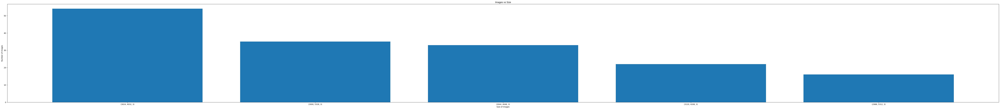

In [11]:
fig = plt.figure(figsize=(100, 10))
y = list(df['image size'].value_counts())
x = df['image size'].value_counts().index.to_list()
plt.bar(x, y)
plt.title("Images vs Size")
plt.xlabel("Size of Images")
plt.ylabel("Number of Images")

### Displaying few clean-noisy image pairs

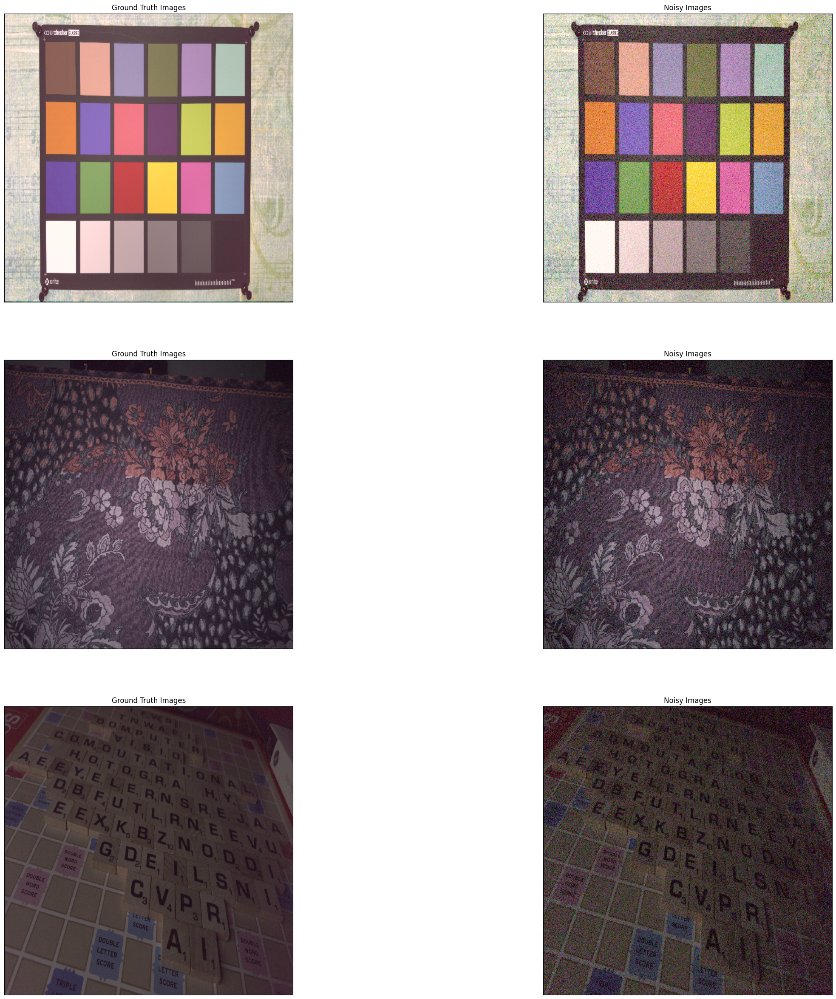

In [12]:
sample = df.sample(3)
fig, ax = plt.subplots(len(sample), 2, figsize=(30, 30))
for i in range(len(sample)):
    img = cv2.imread(sample['Ground Truth Images'].iloc[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (512, 512))
    ax[i][0].imshow(img)
    ax[i][0].get_xaxis().set_visible(False)
    ax[i][0].get_yaxis().set_visible(False)
    ax[i][0].title.set_text("Ground Truth Images")

    img = cv2.imread(sample['Noisy Images'].iloc[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (512, 512))
    ax[i][1].imshow(img)
    ax[i][1].get_xaxis().set_visible(False)
    ax[i][1].get_yaxis().set_visible(False)
    ax[i][1].title.set_text("Noisy Images")

### Splitting the dataset into test and train

In [13]:
X = df['Noisy Images']
y = df['Ground Truth Images']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [14]:
# storing the image patches as pickle files
pickle.dump((X_train, y_train), open('train_path.pkl', 'wb'))
pickle.dump((X_test, y_test), open('test_path.pkl', 'wb'))

In [15]:
X_train, y_train = pickle.load(open('train_path.pkl', "rb"))
X_test, y_test = pickle.load(open('test_path.pkl', 'rb'))

In [16]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(128,)
(128,)
(32,)
(32,)


### Creating Patches

In [20]:
def patches(img, patch_size):
    patches = patchify(img, (patch_size, patch_size, 3), step=patch_size)
    return patches

In [21]:
X_train_patches = []
y_train_patches = []

for i in range(len(X_train)):
    path = X_train.iloc[i]
    img_nsy = cv2.imread(path)
    img_nsy = cv2.cvtColor(img_nsy, cv2.COLOR_BGR2RGB)
    img_nsy = cv2.resize(img_nsy, (1024, 1024))
    patches_nsy = patches(img_nsy, 256)

    path = X_train.iloc[i]
    img_gt = cv2.imread(path)
    img_gt = cv2.cvtColor(img_gt, cv2.COLOR_BGR2RGB)
    img_gt = cv2.resize(img_gt, (1024, 1024))
    patches_gt = patches(img_gt, 256)

    rows = patches_nsy.shape[0]
    cols = patches_nsy.shape[1]

    for j in range(rows):
        for k in range(cols):
            X_train_patches.append(patches_nsy[j][k][0])
            y_train_patches.append(patches_gt[j][k][0])

X_train = np.array(X_train_patches)
y_train = np.array(y_train_patches)

In [22]:
X_test_patches = []
y_test_patches = []

for i in range(len(X_test)):
    path = X_test.iloc[i]
    img_nsy = cv2.imread(path)
    img_nsy = cv2.cvtColor(img_nsy, cv2.COLOR_BGR2RGB)
    img_nsy = cv2.resize(img_nsy,(1024,1024))  #resizing the X_test images
    patches_nsy = patches(img_nsy,256)

    path = y_test.iloc[i]
    img_gt = cv2.imread(path)
    img_gt = cv2.cvtColor(img_gt, cv2.COLOR_BGR2RGB)
    img_gt = cv2.resize(img_gt,(1024,1024))  #resizing the y_test images
    patches_gt = patches(img_gt,256)

    rows = patches_nsy.shape[0]
    cols = patches_nsy.shape[1]

    for j in range(rows):
        for k in range(cols):
            X_test_patches.append(patches_nsy[j][k][0])
            y_test_patches.append(patches_gt[j][k][0])

X_test = np.array(X_test_patches)
y_test = np.array(y_test_patches)

In [23]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(2048, 256, 256, 3)
(2048, 256, 256, 3)
(512, 256, 256, 3)
(512, 256, 256, 3)


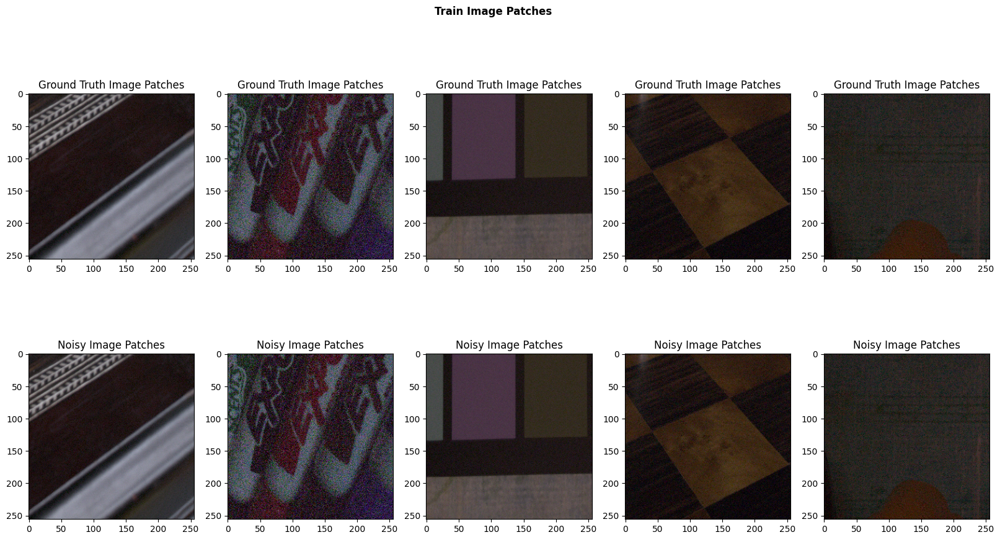

In [25]:
fig, axs = plt.subplots(2,5,figsize=(20,10))
r = random.sample(range(0, 2048), 5)

fig.suptitle('Train Image Patches',fontweight ="bold")
for i in range(5):
    axs[0][i].imshow(y_train[r[i]])
    axs[0][i].set_title('Ground Truth Image Patches')
    axs[1][i].imshow(X_train[r[i]])
    axs[1][i].set_title('Noisy Image Patches')

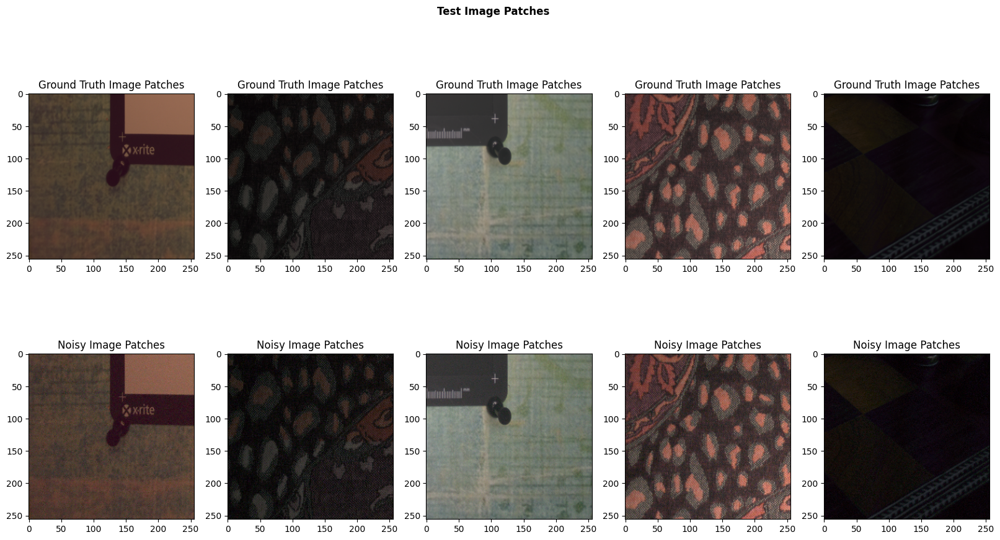

In [27]:
fig, axs = plt.subplots(2,5,figsize=(20,10))
r = random.sample(range(0, 512), 5)

fig.suptitle('Test Image Patches',fontweight ="bold")
for i in range(5):
    axs[0][i].imshow(y_test[r[i]])
    axs[0][i].set_title('Ground Truth Image Patches')
    axs[1][i].imshow(X_test[r[i]])
    axs[1][i].set_title('Noisy Image Patches')

In [28]:
print("Total number of image patches on train data : ", len(X_train))
print("Total number of image patches on test data : ", len(X_test))

Total number of image patches on train data :  2048
Total number of image patches on test data :  512


In [29]:
pickle.dump((X_train,y_train),open('train_data.pkl','wb'))
pickle.dump((X_test,y_test),open('test_data.pkl','wb'))